<a href="https://colab.research.google.com/github/princekjha/Nyc-Taxi-Trip-Time-Prediction/blob/main/final_copy_of_My_NYC_Taxi_Trip_Time_Prediction_Capstone_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# <b><u> Project Title : Taxi trip time Prediction : Predicting total ride duration of taxi trips in New York City</u></b>

## <b> Problem Description </b>

### Your task is to build a model that predicts the total ride duration of taxi trips in New York City. Your primary dataset is one released by the NYC Taxi and Limousine Commission, which includes pickup time, geo-coordinates, number of passengers, and several other variables.

## <b> Data Description </b>

### The dataset is based on the 2016 NYC Yellow Cab trip record data made available in Big Query on Google Cloud Platform. The data was originally published by the NYC Taxi and Limousine Commission (TLC). The data was sampled and cleaned for the purposes of this project. Based on individual trip attributes, you should predict the duration of each trip in the test set.

### <b>NYC Taxi Data.csv</b> - the training set (contains 1458644 trip records)


### Data fields
* #### id - a unique identifier for each trip
* #### vendor_id - a code indicating the provider associated with the trip record
* #### pickup_datetime - date and time when the meter was engaged
* #### dropoff_datetime - date and time when the meter was disengaged
* #### passenger_count - the number of passengers in the vehicle (driver entered value)
* #### pickup_longitude - the longitude where the meter was engaged
* #### pickup_latitude - the latitude where the meter was engaged
* #### dropoff_longitude - the longitude where the meter was disengaged
* #### dropoff_latitude - the latitude where the meter was disengaged
* #### store_and_fwd_flag - This flag indicates whether the trip record was held in vehicle memory before sending to the vendor because the vehicle did not have a connection to the server - Y=store and forward; N=not a store and forward trip
* #### trip_duration - duration of the trip in seconds



# NYC TAXI TRIP TIME PREDICTION

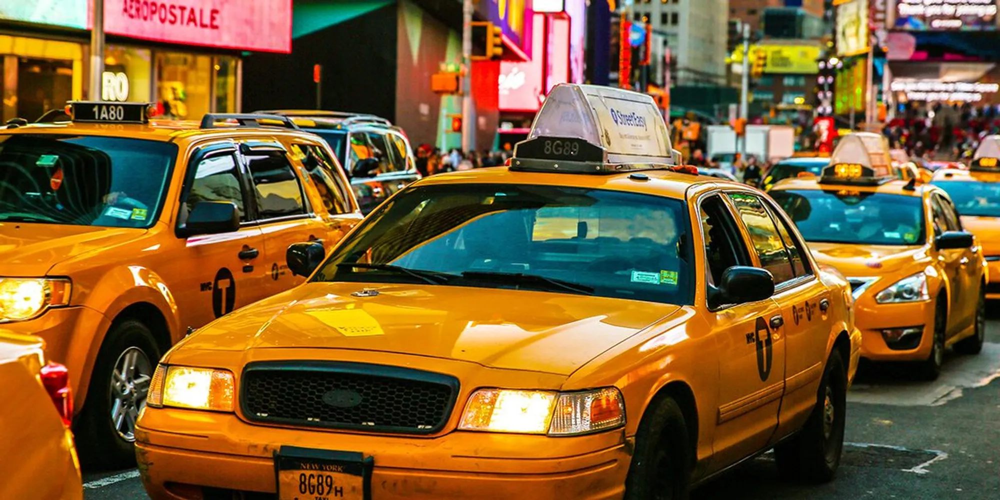

# Importing important lirabries

In [ ]:
#importing required libraries

import pandas as pd
import numpy as np  

#data visualisation
import seaborn as sns 
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker


import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

import datetime as dt

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.metrics import r2_score, mean_squared_log_error , mean_squared_error,mean_absolute_error
from sklearn.linear_model import LinearRegression,ElasticNet, Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.metrics import r2_score, mean_squared_log_error , mean_squared_error
from sklearn.linear_model import LinearRegression
from xgboost import XGBRegressor



# Data Gathering and Discovery

In [ ]:
# mounting drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# reading our csv data file
taxi_data = pd. read_csv('/content/drive/MyDrive/ML project (supervised learning)/NYC Taxi Data .csv 3.csv')

In [ ]:
# top 5 rows & columns of data set
taxi_data.head(5)

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration
0,id2875421,2,3/14/2016 17:24,3/14/2016 17:32,1,-73.982155,40.767937,-73.964630,40.765602,N,455
1,id2377394,1,6/12/2016 0:43,6/12/2016 0:54,1,-73.980415,40.738564,-73.999481,40.731152,N,663
2,id3858529,2,1/19/2016 11:35,1/19/2016 12:10,1,-73.979027,40.763939,-74.005333,40.710087,N,2124
3,id3504673,2,4/6/2016 19:32,4/6/2016 19:39,1,-74.010040,40.719971,-74.012268,40.706718,N,429
4,id2181028,2,3/26/2016 13:30,3/26/2016 13:38,1,-73.973053,40.793209,-73.972923,40.782520,N,435


In [ ]:
# last 5 rows & columns of data set
taxi_data.tail(5)

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration
1048570,id0002921,1,4/6/2016 14:16,4/6/2016 14:20,1,-73.973015,40.760948,-73.976387,40.755604,N,207
1048571,id1329189,2,3/24/2016 1:26,3/24/2016 1:38,1,-73.985550,40.727257,-73.957039,40.712387,N,740
1048572,id0408460,1,2/23/2016 16:38,2/23/2016 16:48,1,-73.972038,40.750202,-73.998360,40.733360,N,605
1048573,id0147762,1,5/24/2016 7:20,5/24/2016 7:25,1,-73.993332,40.724342,-74.004250,40.707470,N,287
1048574,id0859354,2,3/15/2016 22:00,3/15/2016 22:19,1,-73.988060,40.759548,-74.005585,40.711521,N,1169


In [ ]:
# shape of our data
taxi_data.shape

(1048575, 11)

In [ ]:
 # lets see columns name of data
print( taxi_data.columns)

Index(['id', 'vendor_id', 'pickup_datetime', 'dropoff_datetime',
       'passenger_count', 'pickup_longitude', 'pickup_latitude',
       'dropoff_longitude', 'dropoff_latitude', 'store_and_fwd_flag',
       'trip_duration'],
      dtype='object')


In [ ]:
# Attribute informations
taxi_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1048575 entries, 0 to 1048574
Data columns (total 11 columns):
 #   Column              Non-Null Count    Dtype  
---  ------              --------------    -----  
 0   id                  1048575 non-null  object 
 1   vendor_id           1048575 non-null  int64  
 2   pickup_datetime     1048575 non-null  object 
 3   dropoff_datetime    1048575 non-null  object 
 4   passenger_count     1048575 non-null  int64  
 5   pickup_longitude    1048575 non-null  float64
 6   pickup_latitude     1048575 non-null  float64
 7   dropoff_longitude   1048575 non-null  float64
 8   dropoff_latitude    1048575 non-null  float64
 9   store_and_fwd_flag  1048575 non-null  object 
 10  trip_duration       1048575 non-null  int64  
dtypes: float64(4), int64(3), object(4)
memory usage: 88.0+ MB


In [ ]:
# checking of dublicate values
taxi_data.duplicated().sum()


0

there is no duplicate rows and values

In [ ]:
# checking for missing values
taxi_data.isnull().sum()

id                    0
vendor_id             0
pickup_datetime       0
dropoff_datetime      0
passenger_count       0
pickup_longitude      0
pickup_latitude       0
dropoff_longitude     0
dropoff_latitude      0
store_and_fwd_flag    0
trip_duration         0
dtype: int64

as we can say there is no missing values .


let see the unique values

In [ ]:
# checking foe unique values
print(taxi_data.nunique().sort_values())

vendor_id                   2
store_and_fwd_flag          2
passenger_count            10
trip_duration            6883
pickup_longitude        21382
dropoff_longitude       30924
pickup_latitude         42587
dropoff_latitude        58292
pickup_datetime        237127
dropoff_datetime       237442
id                    1048575
dtype: int64


In [ ]:

# statistical information of data 
taxi_data.describe()

,vendor_id,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,trip_duration
count,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06,1.048575e+06
mean,1.534503e+00,1.664382e+00,-7.397342e+01,4.075094e+01,-7.397336e+01,4.075183e+01,9.621448e+02
std,4.988084e-01,1.314261e+00,4.280165e-02,3.381389e-02,4.274282e-02,3.645002e-02,5.853002e+03
min,1.000000e+00,0.000000e+00,-7.854740e+01,3.435970e+01,-7.981798e+01,3.218114e+01,1.000000e+00
25%,1.000000e+00,1.000000e+00,-7.399186e+01,4.073738e+01,-7.399131e+01,4.073594e+01,3.970000e+02
50%,2.000000e+00,1.000000e+00,-7.398174e+01,4.075415e+01,-7.397973e+01,4.075455e+01,6.620000e+02
75%,2.000000e+00,2.000000e+00,-7.396731e+01,4.076836e+01,-7.396301e+01,4.076984e+01,1.075000e+03
max,2.000000e+00,9.000000e+00,-6.133553e+01,5.188108e+01,-6.133553e+01,4.391176e+01,3.526282e+06


Text(0.5, 1.0, 'Descriptive Stats')

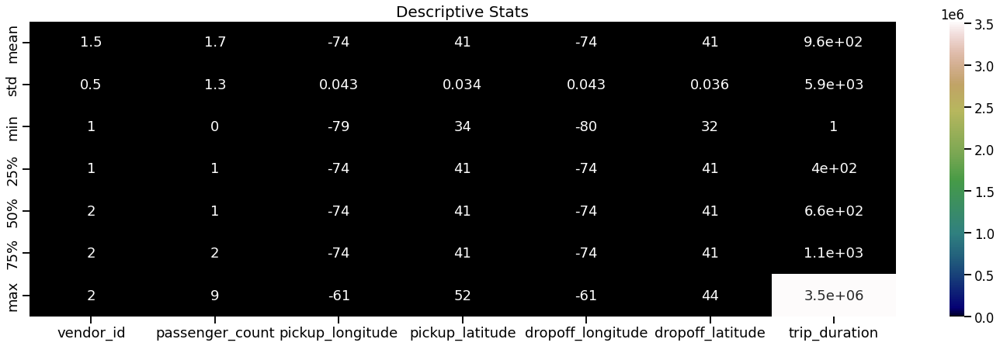

In [ ]:
# #Descriptive Stats in visual form
plt.figure(figsize=(25,7))
svm = sns.heatmap(taxi_data.describe()[1:], annot=True , cmap='gist_earth',annot_kws={"size": 18})
svm.set_xticklabels(svm.get_xmajorticklabels(), fontsize = 18)
svm.set_yticklabels(svm.get_ymajorticklabels(), fontsize = 18)
plt.title('Descriptive Stats', fontsize = 20)

* We can observe that there were trips having 0 passengers which we can consider as false trip.
* Also, there are trips having trip duration upto 3526282 seconds (Approx. 980 hours) which is kind of impossible in a day.

# Feature Creation

* Let us create some new features from the existing variables so that we can gain more insights from the data.
* Remember pickup_datetime and dropoff_datetime were both of type object. If we want to make use of this data, we can convert it to datetime object which contains numerous functions with which we can create new features that we will see soon.

In [ ]:
# Now will analyze this features (pickup_datetime ,dropoff_datetime)    
# We can convert it to datetime using the following code.

taxi_data['pickup_datetime']=pd.to_datetime(taxi_data['pickup_datetime'])
taxi_data['dropoff_datetime']=pd.to_datetime(taxi_data['dropoff_datetime'])

Now if you will run the dtypes function again, you will be able to see the type as datetime64.

Now, let us extract and create new features from this datetime features we just created.

In [ ]:
# creating some new feature from datetime feature
taxi_data['pickup_month'] = taxi_data['pickup_datetime'].dt.month
taxi_data['dropoff_month']=taxi_data['dropoff_datetime'].dt.month

taxi_data['pickup_hour'] = taxi_data['pickup_datetime'].dt.hour
taxi_data['dropoff_hour']=taxi_data['dropoff_datetime'].dt.hour

taxi_data['pickup_weekday'] = taxi_data['pickup_datetime'].dt.weekday
taxi_data['dropoff_weekday']=taxi_data['dropoff_datetime'].dt.weekday

taxi_data['pickup_day'] = taxi_data['pickup_datetime'].dt.day
taxi_data['dropoff_day']=taxi_data['dropoff_datetime'].dt.day

taxi_data['pickup_date'] = taxi_data['pickup_datetime'].dt.date

taxi_data['pickup_min'] = taxi_data['pickup_datetime'].dt.minute
taxi_data['dropoff_min'] = taxi_data['dropoff_datetime'].dt.minute

* The Date and time columns in the Dataset has whole lot story to tell, we have to fetch them as separate features.
* We do not have to extract pickup and dropoff time both, as they may lead to strong positive correlation between them. (For analysis purpose obviosly we can extract)
* Further we can use these columns for Analysis.


Now let us apply this function and create new columns in the dataset.

In [ ]:
from geopy.distance import great_circle

In [ ]:
# Trip_distance is a function to calculate distance between pickup and dropoff place.

def Trip_distance(pickup_lat,pickup_long,dropoff_lat,dropoff_long):
 
 start_place=(pickup_lat,pickup_long)
 stop_place=(dropoff_lat,dropoff_long)
 
 return great_circle(start_place,stop_place).km

Finally, applying the function to our dataset and creating the feature ‘distance’.

In [ ]:
#Calculate distance and assign new column to the dataframe.

taxi_data['distance'] = taxi_data.apply(lambda x: Trip_distance(x['pickup_latitude'],x['pickup_longitude'],x['dropoff_latitude'],x['dropoff_longitude'] ), axis=1)

In [ ]:
taxi_data.head(5)

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,...,pickup_hour,dropoff_hour,pickup_weekday,dropoff_weekday,pickup_day,dropoff_day,pickup_date,pickup_min,dropoff_min,distance
0,id2875421,2,2016-03-14 17:24:00,2016-03-14 17:32:00,1,-73.982155,40.767937,-73.964630,40.765602,N,...,17,17,0,0,14,14,2016-03-14,24,32,1.498523
1,id2377394,1,2016-06-12 00:43:00,2016-06-12 00:54:00,1,-73.980415,40.738564,-73.999481,40.731152,N,...,0,0,6,6,12,12,2016-06-12,43,54,1.805510
2,id3858529,2,2016-01-19 11:35:00,2016-01-19 12:10:00,1,-73.979027,40.763939,-74.005333,40.710087,N,...,11,12,1,1,19,19,2016-01-19,35,10,6.385108
3,id3504673,2,2016-04-06 19:32:00,2016-04-06 19:39:00,1,-74.010040,40.719971,-74.012268,40.706718,N,...,19,19,2,2,6,6,2016-04-06,32,39,1.485501
4,id2181028,2,2016-03-26 13:30:00,2016-03-26 13:38:00,1,-73.973053,40.793209,-73.972923,40.782520,N,...,13,13,5,5,26,26,2016-03-26,30,38,1.188591


# Data Visualization( EDA)

<b>Vendor id</b>

Text(0.5, 1.0, 'Vendor ID')

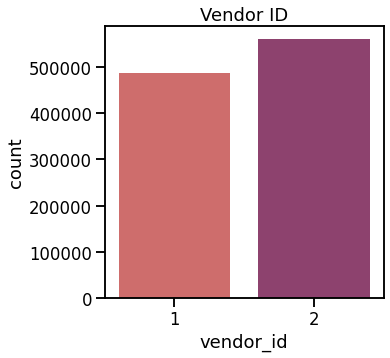

In [ ]:
#vendor_id - a code indicating the provider associated with the trip record

sns.set_context('talk')

plt.figure(figsize=(5,5))
sns.countplot(taxi_data['vendor_id'], palette='flare')
plt.title("Vendor ID")

- From Above Visualization, we can say that there are **2 vendors** (Service Providers).


- 2nd Service provider is the most opted one by New Yorkers.


**Store and Forward Flag**

In [ ]:
taxi_data['store_and_fwd_flag'].value_counts()

N    1042766
Y       5809
Name: store_and_fwd_flag, dtype: int64

We see there are less than 1% of trips that were stored before forwarding.

In [ ]:
import plotly.express as px

Text(0.5, 1.0, 'Store and Forward Flag')

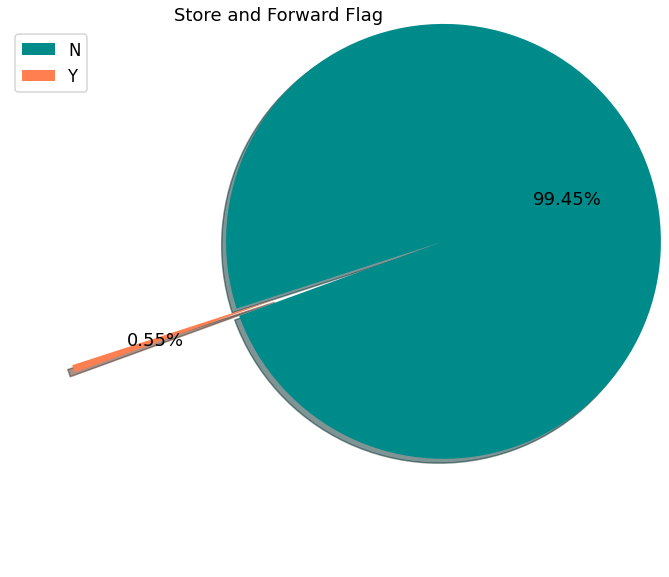

In [ ]:
#Store & Forward flag

plt.figure(figsize=(15,10))
mycolors = ['DarkCyan','coral']
plt.pie(taxi_data['store_and_fwd_flag'].value_counts(), shadow=True,colors=mycolors, explode=[0.8,0], autopct='%1.2f%%', startangle=200)
plt.legend(labels=['N','Y'])
plt.title("Store and Forward Flag")

- We see there are less than 1% of trips that were stored before forwarding

- The number of N flag is much larger. We can later see whether they have any relation with the duration of the trip.

- We will also perform Conversion of 'store_and_fwd_flag' and 'vendor_id' to be Label encoded in a while as those are Categorical features. 

**Target Variable - Trip duration**

In [ ]:
taxi_data.columns

Index(['id', 'vendor_id', 'pickup_datetime', 'dropoff_datetime',
       'passenger_count', 'pickup_longitude', 'pickup_latitude',
       'dropoff_longitude', 'dropoff_latitude', 'store_and_fwd_flag',
       'trip_duration', 'pickup_month', 'dropoff_month', 'pickup_hour',
       'dropoff_hour', 'pickup_weekday', 'dropoff_weekday', 'pickup_day',
       'dropoff_day', 'pickup_date', 'pickup_min', 'dropoff_min', 'distance'],
      dtype='object')

In [ ]:
trip = taxi_data['trip_duration']

{'whiskers': [<matplotlib.lines.Line2D at 0x7f3b417d9110>,
 'caps': [<matplotlib.lines.Line2D at 0x7f3b417d9b90>,
 'boxes': [<matplotlib.lines.Line2D at 0x7f3b417e1b50>],
 'medians': [<matplotlib.lines.Line2D at 0x7f3b3ebcc690>],
 'fliers': [<matplotlib.lines.Line2D at 0x7f3b3ebccbd0>],
 'means': []}

<Figure size 1440x360 with 0 Axes>

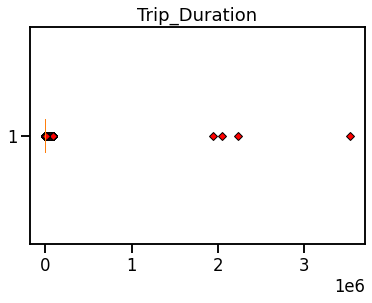

In [ ]:
#Visualising Trip duration
plt.figure(figsize=(20,5))

red_square = dict(markerfacecolor='r', marker='D')
fig1, ax1 = plt.subplots()
ax1.set_title('Trip_Duration')
ax1.boxplot(trip,flierprops=red_square,   vert=False, whis=0.75)

-   we can clearly see there are 4 outliers in this boxplot, their trips are lasting between 1900000 seconds (528 Hours) to somewhere around 3500000 (972 hours) seconds which is impossible in case of taxi trips .


- It’s Quite suspicious. We’ll have to get rid of those Outliers.

In [ ]:
#lets see trip duration column in descending order
print(taxi_data['trip_duration'].sort_values(ascending=False) 
)

978383    3526282
924150    2227612
680594    2049578
355003    1939736
295382      86391
           ...   
35196           1
610159          1
563953          1
555237          1
596136          1
Name: trip_duration, Length: 1048575, dtype: int64


We can see that there is some entries which is significantly different from others.

As there is this 4 rows only, let us drop this rows.

In [ ]:
#Dropping these 4 rows

taxi_data.drop(taxi_data[taxi_data['trip_duration'] == 3526282].index, inplace = True)
taxi_data.drop(taxi_data[taxi_data['trip_duration'] == 2227612].index, inplace = True)
taxi_data.drop(taxi_data[taxi_data['trip_duration'] == 2049578].index, inplace = True)
taxi_data.drop(taxi_data[taxi_data['trip_duration'] == 1939736].index, inplace = True)


In [ ]:
taxi_data.shape

(1048571, 23)

In [ ]:
df = px.data.tips()
fig = px.box(taxi_data, y="trip_duration")
fig.show()

**Passenger Count**

In [ ]:

df = px.data.tips()
fig = px.box(taxi_data, y="passenger_count" , title='passenger count distribution')

fig.show()

- Above visualization tells us that there were most number of trips are done by 1-2 passenger(s).


- 5 - 9 passengers trip states us that cab must be a Large vehicle. 

In [ ]:
taxi_data.passenger_count.value_counts()

1    743129
2    151077
5     56252
3     43033
6     34700
4     20336
0        39
7         3
9         1
8         1
Name: passenger_count, dtype: int64

 - There are some trips with even 0 passenger count.
 - And 3 trips with 7 passengers
 - And there is only 1 trip each for 8 and 9 passengers.

In [ ]:
# Let us remove the rows which have 0 or 7 or 9 passenger count.
taxi_data = taxi_data[taxi_data['passenger_count'] > 0]
taxi_data = taxi_data[taxi_data['passenger_count'] <= 6]

taxi_data_2=taxi_data['passenger_count'].value_counts()



In [ ]:
taxi_data_2=taxi_data['passenger_count'].value_counts()
taxi_data_2

1    743129
2    151077
5     56252
3     43033
6     34700
4     20336
Name: passenger_count, dtype: int64

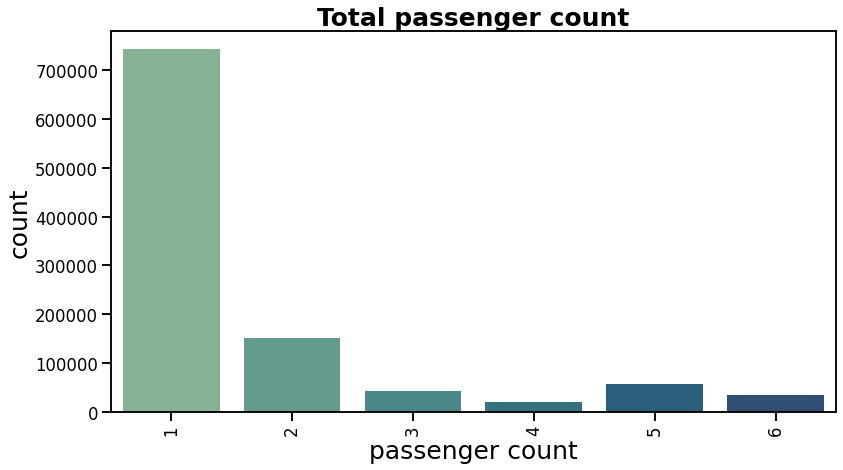

In [ ]:
# Let's see the total passenger count
plt.figure(figsize = (13,7))
sns.barplot(taxi_data_2.index, taxi_data_2.values, palette='crest')
plt.title('Total passenger count',fontsize=25 , fontweight='bold')
plt.xlabel('passenger count',fontsize=25)
plt.ylabel('count',fontsize=25)
plt.xticks(rotation=90)
plt.show()

 - Now, that seems like a fair distribution.

 - We see the highest amount of trips are with 1 passenger.

**Distance**

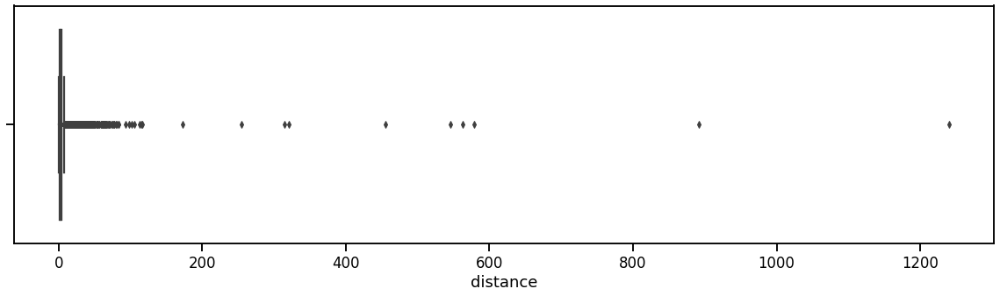

In [ ]:
# firstly try to understand the data under distance 
plt.figure(figsize = (20,5))
sns.boxplot(taxi_data.distance)
plt.show()

In [ ]:
print("There are {} trip records with 0 km distance".format(taxi_data.distance[taxi_data.distance == 0 ].count()))

There are 4277 trip records with 0 km distance


The reasons for 0 km distance can be:

 - The dropoff location couldn’t be tracked.
 - The driver deliberately took this ride to complete a target ride number.
 - The passengers canceled the trip.
 
We will analyze these trips further in bivariate analysis.

In [ ]:
taxi_data[taxi_data.distance == 0 ].head()

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,...,pickup_hour,dropoff_hour,pickup_weekday,dropoff_weekday,pickup_day,dropoff_day,pickup_date,pickup_min,dropoff_min,distance
246,id3487442,2,2016-02-29 18:39:00,2016-02-29 18:42:00,1,-73.981819,40.768963,-73.981819,40.768963,N,...,18,18,0,0,29,29,2016-02-29,39,42,0.0
291,id0924324,2,2016-05-10 18:07:00,2016-05-10 18:26:00,2,-73.959068,40.775661,-73.959068,40.775661,N,...,18,18,1,1,10,10,2016-05-10,7,26,0.0
407,id1145809,2,2016-05-16 23:15:00,2016-05-16 23:31:00,6,-73.808487,40.687336,-73.808487,40.687336,N,...,23,23,0,0,16,16,2016-05-16,15,31,0.0
702,id3499387,1,2016-01-25 19:45:00,2016-01-25 19:54:00,1,-73.786720,40.647041,-73.786720,40.647041,N,...,19,19,0,0,25,25,2016-01-25,45,54,0.0
1620,id0753277,1,2016-01-27 22:29:00,2016-01-27 22:29:00,1,-74.209854,40.816853,-74.209854,40.816853,N,...,22,22,2,2,27,27,2016-01-27,29,29,0.0


**Trips per Day in a week**

Text(0, 0.5, 'Counts')

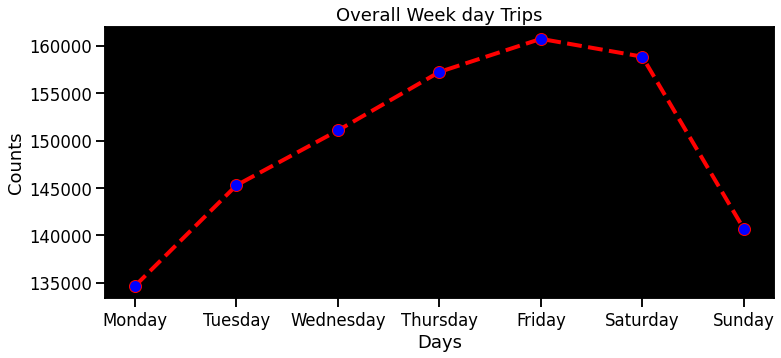

In [ ]:
#Analyzing week day trips

plt.figure(figsize=(12,5))
ax = plt.axes()
ax.set_facecolor("black")
pickup_week = taxi_data['pickup_weekday'].value_counts()
pickup_week.sort_index().plot(kind='line',color = 'red', marker='o' ,linestyle = 'dashed', linewidth = 4,  markerfacecolor='blue', markersize=12)

plt.xticks(ticks=[0,1,2,3,4,5,6], labels=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'], rotation=0)
plt.title('Overall Week day Trips')
plt.xlabel('Days')
plt.ylabel('Counts')

- Observations tells us that Fridays and Saturdays are those days in a week when New Yorkers prefer to rome in the city. GREAT !!

<b>Trips per Hour<b>

In [ ]:
hourly_pickup=taxi_data['pickup_hour'].value_counts()
hourly_pickup= hourly_pickup.sort_values(ascending=True)
hourly_pickup

5     10764
4     11340
3     15059
2     20134
6     23894
1     27672
0     38347
7     39988
16    46492
10    46869
8     48004
9     48630
11    49131
23    50414
13    51342
15    51561
12    51636
14    53667
17    54878
22    57591
20    60341
21    60582
19    64927
18    65264
Name: pickup_hour, dtype: int64

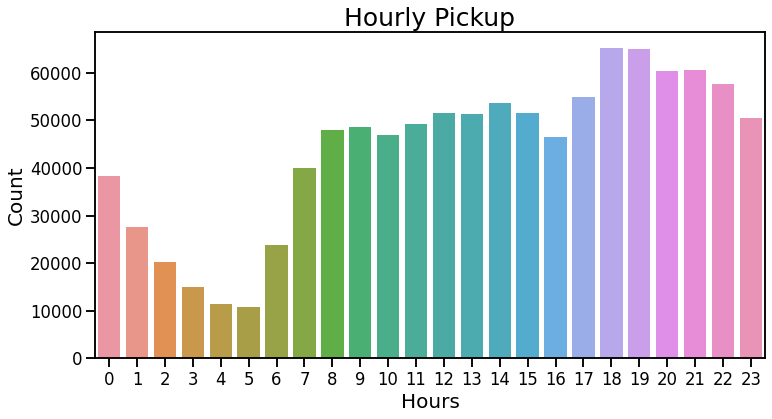

In [ ]:
plt.figure(figsize = (12,6))
sns.barplot(hourly_pickup.index, hourly_pickup.values,)
plt.title('Hourly Pickup',fontsize=25)
plt.xlabel('Hours',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.show()


- In which hour we get to see maximum pickups ? - Rush hours (5 pm to 10 pm), probably office leaving time.

- Thus we observe that most pickups and drops occur in the evening. While the least drops and pickups occur during midday.

<b>Trips per Day in a Month<b>

In [ ]:
pickup_day = taxi_data['pickup_day'].value_counts()


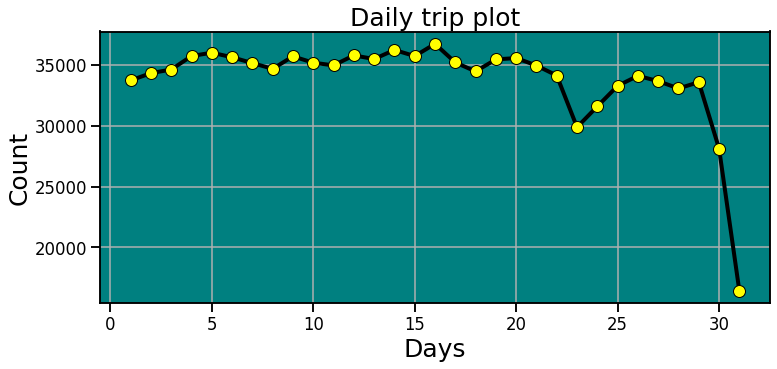

In [ ]:
plt.figure(figsize = (12,5))
ax_1 = plt.axes()
ax_1.set_facecolor("teal")
#plt.plot(pickup_day.index, pickup_day.values, color='blue', marker = 'o', linewidth = 4,  markerfacecolor='red', markersize=12)
pickup_day.sort_index().plot(kind='line', color='black', marker='o', linewidth=4, markerfacecolor='yellow', markersize=12)
plt.title('Daily trip plot',fontsize=25)
plt.xlabel('Days',fontsize=25)
plt.ylabel('Count',fontsize=25)
plt.grid()

plt.show()

- Seem like New Yorker’s do not prefer to get a Taxi on Month end’s , there is a significant drop in the Taxi trip count as month end’s approach.

<b>Trips per month<b>

In [ ]:
sorted(taxi_data['pickup_month'].unique())

[1, 2, 3, 4, 5, 6]

In [ ]:
taxi_data['pickup_month']

0          3
1          6
2          1
3          4
4          3
          ..
1048570    4
1048571    3
1048572    2
1048573    5
1048574    3
Name: pickup_month, Length: 1048527, dtype: int64

In [ ]:
monthly_pickup = taxi_data['pickup_month'].value_counts()
monthly_pickup

3    184128
4    180935
5    178578
2    171588
6    168208
1    165090
Name: pickup_month, dtype: int64

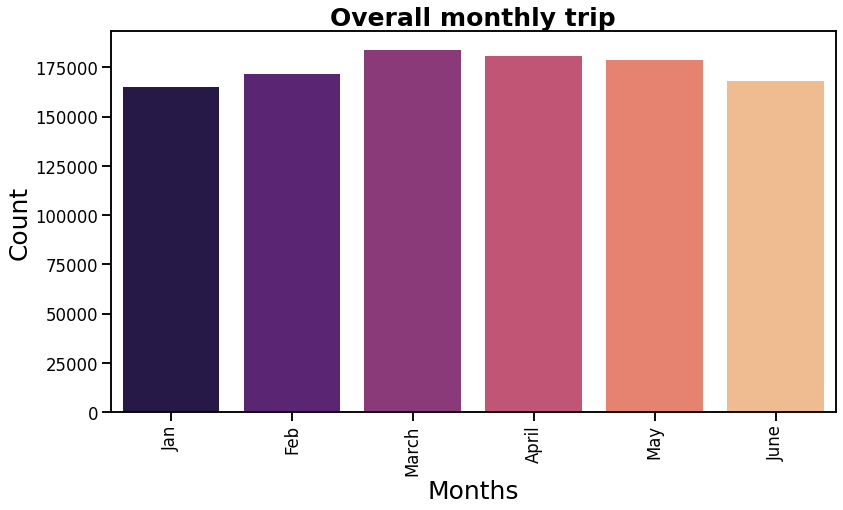

In [ ]:
plt.figure(figsize = (13,7))
sns.barplot(monthly_pickup.index, monthly_pickup.values, palette='magma')
plt.title('Overall monthly trip',fontsize=25 , fontweight='bold')
plt.xlabel('Months',fontsize=25)
plt.ylabel('Count',fontsize=25)
plt.xticks([0,1,2,3,4,5], labels=['Jan','Feb','March','April','May','June'],rotation=90)
plt.show()

- We've data of 6 months.

- Number of trips in a particular month - March and April marking the highest.

- January being lowest probably due to extreme SnowFall NYC.

# Bivariate Analysis with Target Variable

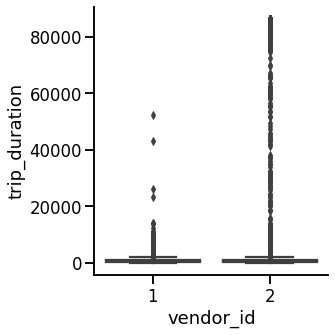

In [ ]:
# Trip Duration per Vendor estimator=np.mean
sns.catplot(x="vendor_id", y="trip_duration",kind="box",data=taxi_data)

Vendor id 2 takes longer trips as compared to vendor 1.

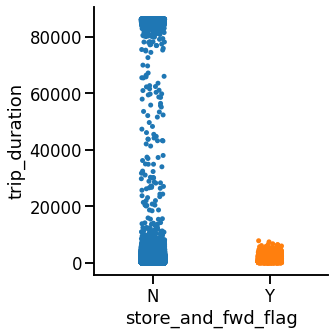

In [ ]:
# Trip Duration per Store and Forward Flag
sns.catplot(y='trip_duration',x='store_and_fwd_flag',data=taxi_data,kind='strip')

Trip duration is generally longer for trips whose flag was not stored.


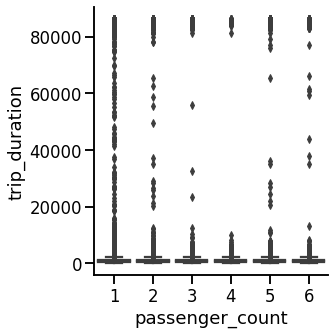

In [ ]:
# Trip Duration per hour
sns.catplot(y='trip_duration',x='passenger_count',data=taxi_data,kind='box')

There is no visible relation between trip duration and passenger count.


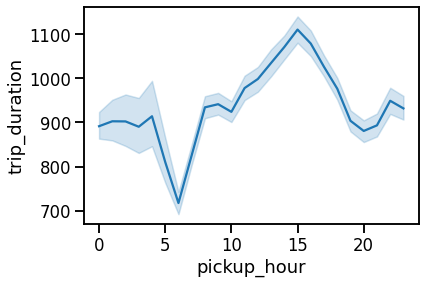

In [ ]:
# Trip Duration per time of day
sns.lineplot(x='pickup_hour',y='trip_duration',data=taxi_data)

We see the trip duration is the maximum around 3 pm which may be because of traffic on the roads.
Trip duration is the lowest around 6 am as streets may not be busy.

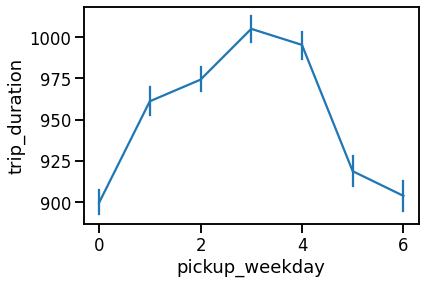

In [ ]:
# Trip Duration per Day of Week
sns.lineplot(x='pickup_weekday',y='trip_duration',data=taxi_data, err_style="bars", ci=68)

Trip duration is the longest on Thursdays closely followed by Fridays.

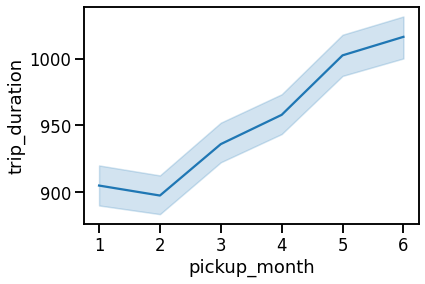

In [ ]:
# Trip Duration per month
sns.lineplot(x='pickup_month',y='trip_duration',data=taxi_data)

From February, we can see trip duration rising every month.

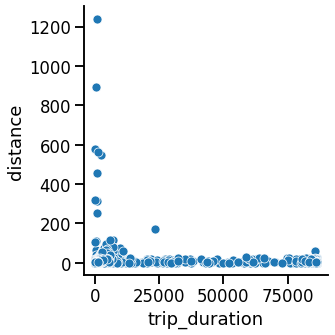

In [ ]:
sns.relplot(y=taxi_data.distance,x='trip_duration',data=taxi_data)

We can see there are trips which trip duration as short as 0 seconds and yet covering a large distance. And, trips with 0 km distance and long trip durations.

Let us see few rows whose distances are 0.

In [ ]:
taxi_data[taxi_data['distance'] == 0].head()

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,...,pickup_hour,dropoff_hour,pickup_weekday,dropoff_weekday,pickup_day,dropoff_day,pickup_date,pickup_min,dropoff_min,distance
246,id3487442,2,2016-02-29 18:39:00,2016-02-29 18:42:00,1,-73.981819,40.768963,-73.981819,40.768963,N,...,18,18,0,0,29,29,2016-02-29,39,42,0.0
291,id0924324,2,2016-05-10 18:07:00,2016-05-10 18:26:00,2,-73.959068,40.775661,-73.959068,40.775661,N,...,18,18,1,1,10,10,2016-05-10,7,26,0.0
407,id1145809,2,2016-05-16 23:15:00,2016-05-16 23:31:00,6,-73.808487,40.687336,-73.808487,40.687336,N,...,23,23,0,0,16,16,2016-05-16,15,31,0.0
702,id3499387,1,2016-01-25 19:45:00,2016-01-25 19:54:00,1,-73.786720,40.647041,-73.786720,40.647041,N,...,19,19,0,0,25,25,2016-01-25,45,54,0.0
1620,id0753277,1,2016-01-27 22:29:00,2016-01-27 22:29:00,1,-74.209854,40.816853,-74.209854,40.816853,N,...,22,22,2,2,27,27,2016-01-27,29,29,0.0


We can see even though distance is recorded as 0 but trip duration is definitely more.

- One reason can be that the dropoff coordinates weren’t recorded.
- Another reason one can think is that for short trip durations, maybe the passenger changed their mind and cancelled the ride after some time.

**Label Encoding**

In [ ]:
#Label Encoding Features having Categorical Values

from sklearn.preprocessing import LabelEncoder

enc = LabelEncoder()
taxi_data['store_and_fwd_flag'] = enc.fit_transform(taxi_data['store_and_fwd_flag'])
taxi_data['vendor_id'] = enc.fit_transform(taxi_data['vendor_id'])

- Conversion of 'store_and_fwd_flag' and 'vendor_id' to be Label encoded as those are Categorical features , binarizing them will help us to compute them with ease.


- We can convert these features into “category” type by function called “astype(‘category’)” that will speed up the Computation. Since, my plan is to go with PCA for dimension reduction, I’m not going with that approach.

Text(0.5, 1.0, 'Correlation Plot')

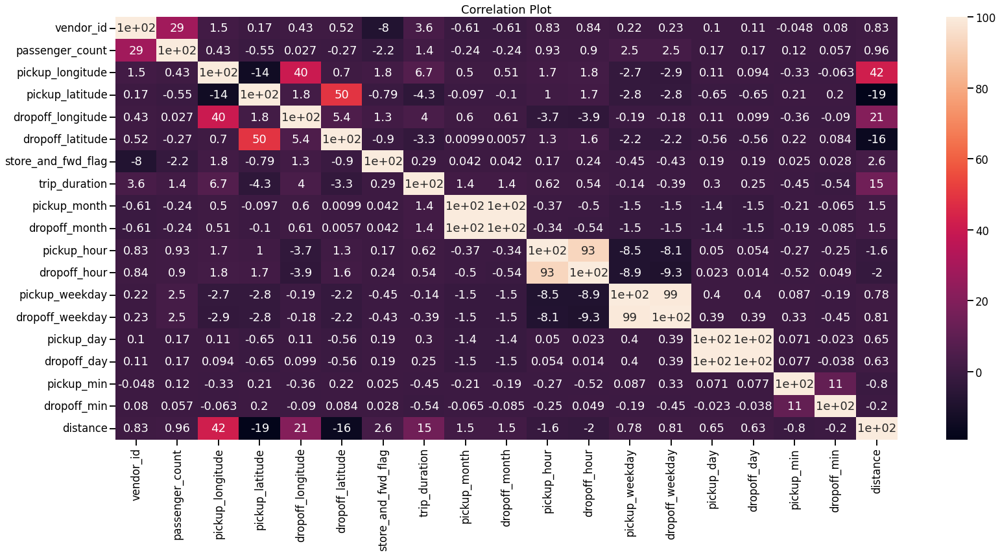

In [ ]:
#Plotting Pearson Correlation heatmap

plt.figure(figsize=(27,12))
sns.heatmap(taxi_data.corr()*100, annot=True)
plt.title('Correlation Plot')

In [ ]:
nyc_taxi_df = taxi_data.drop(['id','pickup_datetime','pickup_date','dropoff_datetime','distance'], axis=1)
nyc_taxi_df.head()

,vendor_id,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,pickup_month,dropoff_month,pickup_hour,dropoff_hour,pickup_weekday,dropoff_weekday,pickup_day,dropoff_day,pickup_min,dropoff_min
0,1,1,-73.982155,40.767937,-73.964630,40.765602,0,455,3,3,17,17,0,0,14,14,24,32
1,0,1,-73.980415,40.738564,-73.999481,40.731152,0,663,6,6,0,0,6,6,12,12,43,54
2,1,1,-73.979027,40.763939,-74.005333,40.710087,0,2124,1,1,11,12,1,1,19,19,35,10
3,1,1,-74.010040,40.719971,-74.012268,40.706718,0,429,4,4,19,19,2,2,6,6,32,39
4,1,1,-73.973053,40.793209,-73.972923,40.782520,0,435,3,3,13,13,5,5,26,26,30,38


In [ ]:
nyc_taxi_df.shape

(1048527, 18)

# Normalization

In [ ]:
#Predictors and Target Variable

X = nyc_taxi_df.drop(['trip_duration'], axis=1)
y = np.log(nyc_taxi_df['trip_duration'])

In [ ]:
# Normalising Predictors and creating new dataframe....................

from sklearn.preprocessing import StandardScaler
cols = X.columns
print(cols)

Index(['vendor_id', 'passenger_count', 'pickup_longitude', 'pickup_latitude',
       'dropoff_longitude', 'dropoff_latitude', 'store_and_fwd_flag',
       'pickup_month', 'dropoff_month', 'pickup_hour', 'dropoff_hour',
       'pickup_weekday', 'dropoff_weekday', 'pickup_day', 'dropoff_day',
       'pickup_min', 'dropoff_min'],
      dtype='object')


In [ ]:
scaler = StandardScaler()
print(scaler)

StandardScaler()


In [ ]:
new_df = scaler.fit_transform(X)
new_df.shape

(1048527, 17)

In [ ]:
new_df = pd.DataFrame(new_df, columns=cols)
new_df.head()

,vendor_id,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,pickup_month,dropoff_month,pickup_hour,dropoff_hour,pickup_weekday,dropoff_weekday,pickup_day,dropoff_day,pickup_min,dropoff_min
0,0.933215,-0.505573,-0.204076,0.502577,0.204301,0.377700,-0.074633,-0.306954,-0.307137,0.529889,0.524136,-1.562039,-1.562032,-0.172201,-0.172221,-0.322673,0.136276
1,-1.071565,-0.505573,-0.163431,-0.366128,-0.611128,-0.567473,-0.074633,1.477969,1.477578,-2.126266,-2.097620,1.508446,1.504368,-0.401990,-0.402010,0.773932,1.398985
2,0.933215,-0.505573,-0.130986,0.384343,-0.748045,-1.145399,-0.074633,-1.496903,-1.496946,-0.407577,-0.246969,-1.050291,-1.050966,0.402273,0.402253,0.312203,-1.126433
3,0.933215,-0.505573,-0.855645,-0.916006,-0.910309,-1.237812,-0.074633,0.288020,0.287768,0.842378,0.832578,-0.538544,-0.539899,-1.091359,-1.091379,0.139055,0.538047
4,0.933215,-0.505573,0.008597,1.250002,0.010262,0.841861,-0.074633,-0.306954,-0.307137,-0.095088,-0.092748,0.996698,0.993302,1.206536,1.206517,0.023623,0.480651


Normalizing the Dataset using Standard Scaling Technique.


Now, Why Standard Scaling ? Why not MinMax or Normalizer ?


- It is because MinMax adjusts the value between 0’s and 1’s , which tend to work better for optimization techniques like Gradient descent and machine learning algorithms like KNN.


- While, Normalizer uses distance measurement like Euclidean or Manhattan, so Normalizer tend to work better with KNN.

# We will use two type of approach :


1.   First approach - with PCA 
2.   Second approach - without PCA

for the first approach we have to pass our scaled dataframe in pca model and ovserve the elbow point.

* Ques- why we use PCA?
* Ans- we use PCA because our data is a high dimensional data and for better result we have to reduce it's dimensionality and for this we use PCA which is very helpful for us.






## Principal Component Analysis (PCA)

 Principal component analysis (PCA) simplifies the complexity in high-dimensional data while retaining trends and patterns. It does this by transforming the data into fewer dimensions, which act as summaries of features

- Now that we’re done, we have to pass our Scaled Dataframe in PCA model and observe the elbow plot to get better idea of explained variance.


- We'll also go through a approach without using PCA in Second Part and Later compare results with PCA approach.

In [ ]:
X = new_df

In [ ]:
#Applying PCA

from sklearn.decomposition import PCA

pca = PCA(n_components=len(nyc_taxi_df.columns)-1)
pca.fit_transform(X)
var_rat = pca.explained_variance_ratio_
var_rat

array([1.26484603e-01, 1.19303062e-01, 1.15941935e-01, 1.05274923e-01,
       8.89907531e-02, 8.23352951e-02, 7.65785950e-02, 6.55735707e-02,
       5.80633252e-02, 5.20645414e-02, 4.15305469e-02, 3.58786903e-02,
       2.76099484e-02, 3.88926450e-03, 3.50500196e-04, 1.30430568e-04,
       1.64653086e-08])

<BarContainer object of 17 artists>

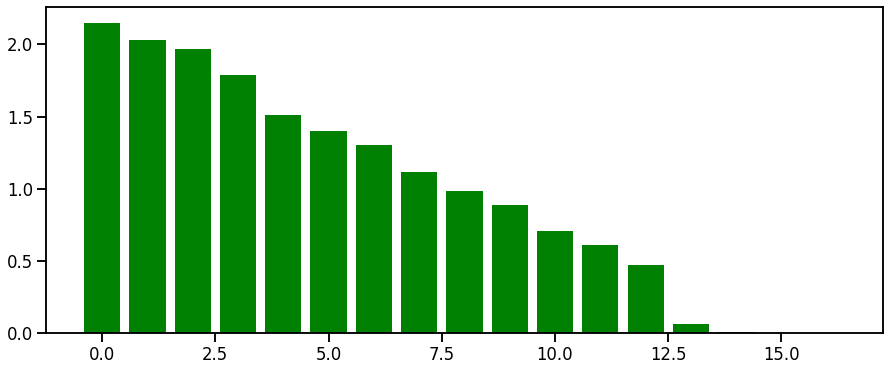

In [ ]:
#Variance Ratio vs PC plot

plt.figure(figsize=(15,6))
plt.bar(np.arange(pca.n_components_), pca.explained_variance_, color="green")

- At 12th component our PCA model seems to go Flat without explaining much of a Variance.

Text(0.5, 1.0, 'Elbow Plot')

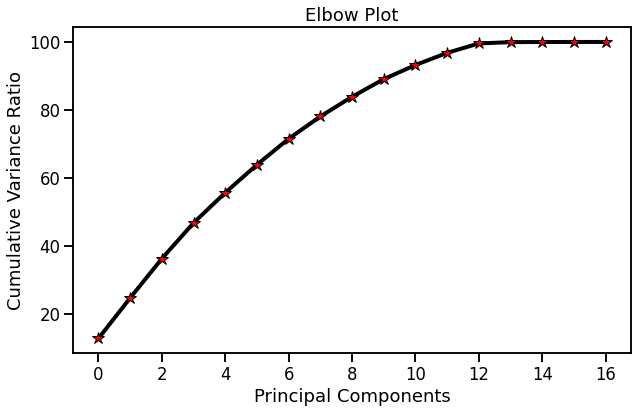

In [ ]:
#Cumulative Variance Ratio

plt.figure(figsize=(10,6))
plt.plot(np.cumsum(var_rat)*100, marker='*', linewidth=4, color='black', markerfacecolor='red', markersize=12) 
plt.xlabel("Principal Components")
plt.ylabel("Cumulative Variance Ratio")
plt.title('Elbow Plot')

In [ ]:
#Applying PCA as per required components

pca = PCA(n_components=12)
transform = pca.fit_transform(X)
pca.explained_variance_

array([2.1502403 , 2.02815398, 1.97101477, 1.7896754 , 1.51284425,
       1.39970135, 1.30183736, 1.11475176, 0.98707747, 0.88509805,
       0.70601997, 0.60993832])

- Above , we had considered 12 as a required number of components and extracted new features by transforming the Data.

Text(0.5, 1.0, 'Contribution of a Particular feature to our Principal Components')

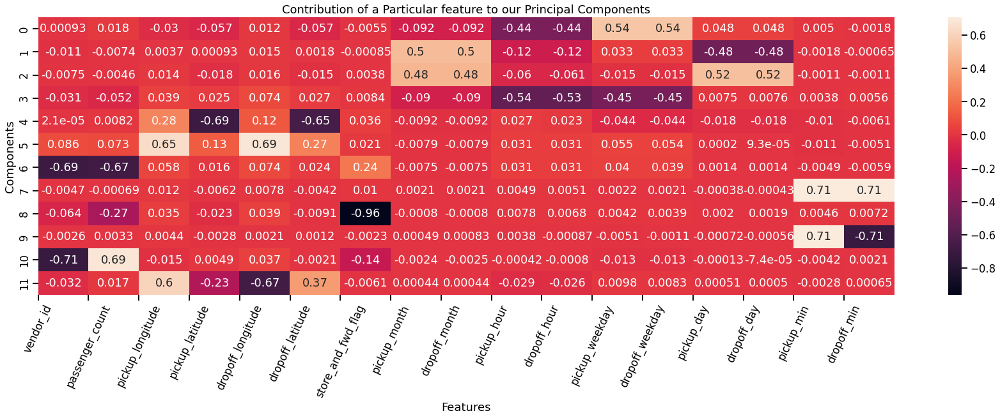

In [ ]:
#importance of features in Particular Principal Component

plt.figure(figsize=(30,8))
sns.heatmap(pca.components_, annot=True)
plt.ylabel("Components")
plt.xlabel("Features")
plt.xticks(np.arange(len(X.columns)), X.columns, rotation=65)
plt.title('Contribution of a Particular feature to our Principal Components')

- Above plot gives us detailed idealogy of which feature has contributed more or less to our each Principal Component.


- Pricipal Components are our new features which consists of Information from every other original Feature we have. 


- We reduce the Dimensions using PCA by retaining as much as Information possible. 

## Splitting Data and Choosing Algorithms:

- Let’s pass the PCA Transformed data in our Machine Learning Regression Algorithms. To begin with , Linear Regression is a good approach, by splitting our Data into Training and Testing (30%).


 - So, I want to approach from base model built using basic Linear Regression and then bring in more Sophisticated Algorithms - Decision Tree & Random Forest. It will give us good idea how Linear Regression performs against Decision Tree Regressor and Random Forest Regressor. Later, we will also approach with same algorithms on "without PCA" data. Finally, we'll evaluate both approaches we took and lay down recommended approach and algorithms.

In [ ]:
#Passing in Transformed values as Predcitors

X = transform
y = np.log(nyc_taxi_df['trip_duration']).values

- RMSE as a evaluation Metrics , We can also hyper tune our Parameters to minimize the loss (RMSE).

In [ ]:
#importing train test split & some important metrics

from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.metrics import r2_score, mean_squared_log_error , mean_squared_error

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=10)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((733968, 12), (314559, 12), (733968,), (314559,))

## **1 - First approach(with PCA ):**

### Linear regression

- Simple to explain.


- Model training and prediction are fast.


- No tuning is required except regularization.

In [ ]:
#implementing Linear regression

from sklearn.linear_model import LinearRegression

est_lr = LinearRegression()
est_lr.fit(X_train, y_train)
lr_pred = est_lr.predict(X_test)
lr_pred

array([6.42121643, 6.48861649, 6.38341405, ..., 6.35688764, 6.35164684,
       6.38553078])

In [ ]:
#coeficients & intercept

est_lr.intercept_, est_lr.coef_

(6.464976479008899,
 array([-0.0223785 ,  0.01118638,  0.02516873, -0.00769049,  0.14428197,
         0.09083919, -0.00581157, -0.00332704, -0.002595  , -0.00272525,
        -0.00098975,  0.01426467]))

Interpreting the coefficients:

Here we can see Increase and decrease order at each principal component in trip duration.

**Note: The Units / Values can change everytime you run the model freshly.**

In [ ]:
#examining scores

print ("Training Score : " , est_lr.score(X_train, y_train))

print ("Validation Score : ", est_lr.score(X_test, y_test))

print ("Cross Validation Score : " , cross_val_score(est_lr, X_train, y_train, cv=5).mean())

print ("R2_Score : ", r2_score(lr_pred, y_test))

#print ("RMSE : ", np.sqrt(mean_squared_log_error(lr_pred, y_test)))

Training Score :  0.06618865644266136
Validation Score :  0.045641032058727826
Cross Validation Score :  0.06082033629282222
R2_Score :  -10.22138441224225


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



Text(0.5, 1.0, 'Test VS Prediction')

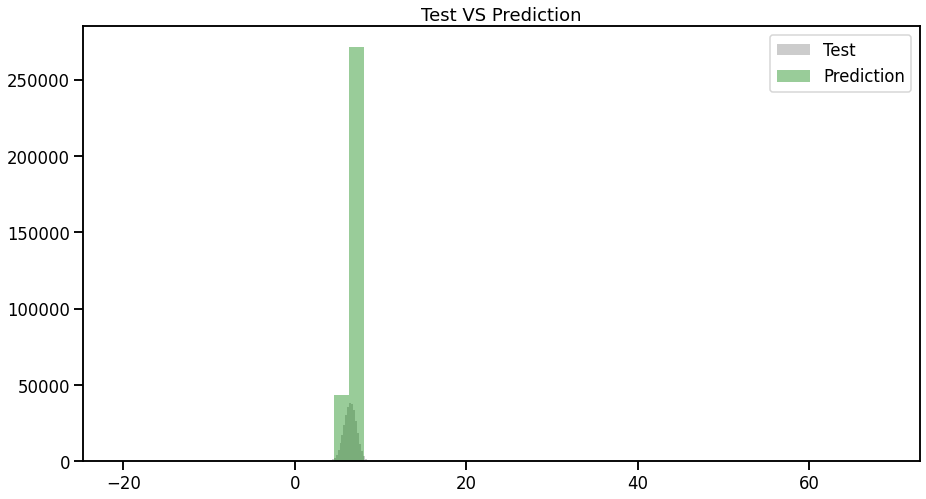

In [ ]:
#prediction vs real data

plt.figure(figsize=(15,8))
plt.subplot(1,1,1)
sns.distplot(y_test, kde=False, color="grey", label="Test")

plt.subplot(1,1,1)
sns.distplot(lr_pred, kde=False, color="green", label="Prediction")
plt.legend()
plt.title("Test VS Prediction")

From the above Visualization . we can clearly identify that the Linear Regression isn't performing good. The Actual Data (in Grey) and Predicted values (in Green) are so much differing. We can conclude that Linear Regression doesn't seem like a right choice for Trip duration prediction.

### Decision Tree

- Decision trees are very intuitive and easy to explain.


- They follow the same pattern of thinking that humans use when making decisions.


- Decision trees are a common-sense technique to find the best solutions to problems with uncertainty.

In [ ]:
#implementation of decision tree

from sklearn.tree import DecisionTreeRegressor

d_tree = DecisionTreeRegressor(criterion="mse", max_depth=10)
d_tree.fit(X_train, y_train)
dt_pred = d_tree.predict(X_test)
dt_pred

array([6.17321256, 7.18713439, 4.83517921, ..., 6.73398381, 4.83517921,
       6.49129594])

In [ ]:
#examining metrics

print ("Training Score : " , d_tree.score(X_train, y_train))

print ("Validation Score : ", d_tree.score(X_test, y_test))

print ("Cross Validation Score : " , cross_val_score(d_tree, X_train, y_train, cv=5).mean())

print ("R2_Score : ", r2_score(dt_pred, y_test))

print ("RMSE : ", np.sqrt(mean_squared_log_error(dt_pred, y_test)))

Training Score :  0.9506977243025185
Validation Score :  0.9420689208534674
Cross Validation Score :  0.9406716213013393
R2_Score :  0.9392097456255346
RMSE :  0.030573366973899115


In [ ]:
print(y_test)

[6.08449941 7.16935002 4.80402104 ... 6.78445706 4.90527478 6.44571982]


- Our Goal is to reduce the value of loss function (RMSE) as much as possible.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



Text(0.5, 1.0, 'Test VS Prediction')

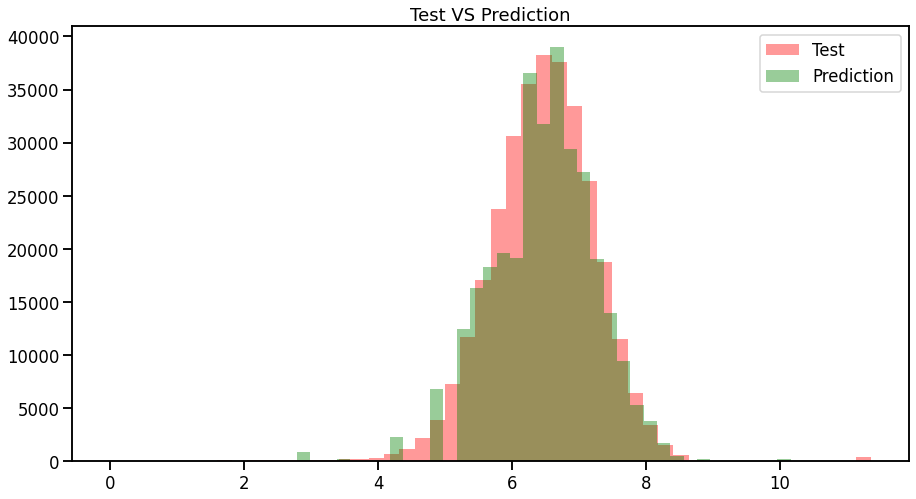

In [ ]:
#prediction vs real data

plt.figure(figsize=(15,8))
plt.subplot(1,1,1)
sns.distplot(y_test, kde=False, color="red", label="Test")

plt.subplot(1,1,1)
sns.distplot(dt_pred, kde=False, color="green", label="Prediction")
plt.legend()
plt.title("Test VS Prediction")

- From the above Visualization. we can clearly identify that the Decision Tree Algorithm is performing good. The Actual Data (in Grey) and Predicted values (in Green) are as close as possible. We can conclude that Decision Tree could be a good choice for Trip duration prediction.

### Random Forest

- It is one of the most accurate learning algorithms available.


- Random Forest consisits of multiple Decision Tress - Results from multiple trees are then merged to give best possible final outcome.


- Random forests overcome several problems with decision trees like Reduction in overfitting.

- Now, Let us also try Random Forest on our Data and see what do we get.

In [ ]:
#Random forest implementation

from sklearn.ensemble import RandomForestRegressor

est_rf = RandomForestRegressor(criterion="mse", n_estimators=5, max_depth=10)
est_rf.fit(X_train, y_train)
rf_pred = est_rf.predict(X_test)
rf_pred

array([6.17222522, 7.187575  , 4.83640951, ..., 6.73379019, 4.83640951,
       6.49223881])

In [ ]:
#examining metrics 

print ("Training Score : " , est_rf.score(X_train, y_train))

print ("Validation Score : ", est_rf.score(X_test, y_test))

print ("Cross Validation Score : " , cross_val_score(est_rf, X_train, y_train, cv=5).mean())

print ("R2_Score : ", r2_score(rf_pred, y_test))

print ("RMSE : ", np.sqrt(mean_squared_log_error(rf_pred, y_test)))

Training Score :  0.9517964184649413
Validation Score :  0.9450552748860427
Cross Validation Score :  0.9449455220802518
R2_Score :  0.9419563191796508
RMSE :  0.03006651575220637


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



Text(0.5, 1.0, 'Test VS Prediction')

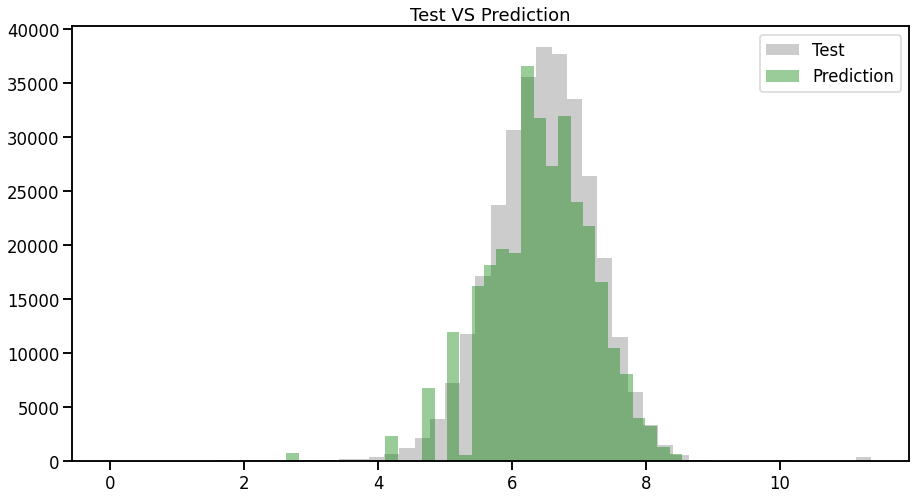

In [ ]:
#prediction vs real data

plt.figure(figsize=(15,8))
plt.subplot(1,1,1)
sns.distplot(y_test, kde=False, color="grey", label="Test")

plt.subplot(1,1,1)
sns.distplot(rf_pred, kde=False, color="green", label="Prediction")
plt.legend()
plt.title("Test VS Prediction")

- From the above Viz. we can clearly identify that the Random Forest Algorithm is also performing good. The Actual Data (in Grey) and Predicted values (in Green) are as close as possible. We can conclude that Random Forest could be a good choice for Trip duration prediction.


- Similarly, we can Hyper tune Random Forest to get the most out of it.

### conclusion
- We can observe from above Viz. that our Decision Tree model and Random Forest model are good performers. As, Random Forest is providing us reduced RMSE, we can say that it's a model to Opt for.

**- we also applied some other type of algorithms like xgboost & elasticnet but result are not acceptable so that's why i thinked that there is no need to show these type of algorithms .**

## **2 - The Second approach(without PCA):**





- Another approach we could go with is without PCA, just Standard Scaling Dataset and applying our Algorithms.


- The approach can give us better idea of what works better for us.


- This approach might take great amount of computational resources and time, it will be good if we can run this on Google’s Collaboratory, that will eliminate huge computational stress on our system as the program will be running on Cloud.

In [ ]:
X = new_df
y = np.log(nyc_taxi_df['trip_duration']).values

### Linear Regression

In [ ]:
#train test split

from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.metrics import r2_score, mean_squared_log_error , mean_squared_error

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=10)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((733968, 17), (314559, 17), (733968,), (314559,))

In [ ]:
#implenting linear regression

from sklearn.linear_model import LinearRegression

est_lr = LinearRegression()
est_lr.fit(X_train, y_train)
lr_pred = est_lr.predict(X_test)
lr_pred

array([6.37400191, 6.49941607, 6.31669901, ..., 6.36838496, 6.28071676,
       6.38303411])

In [ ]:
#Intercept & Coef

est_lr.intercept_, est_lr.coef_

(6.465046901090182,
 array([ 2.59628737e-03,  1.09003457e-02,  9.97914667e-02, -6.95827356e-02,
         5.96755047e-02, -6.73854378e-02,  7.31018817e-03, -3.76137586e+02,
         3.76214280e+02, -1.96156418e+00,  2.01929206e+00, -7.02792627e-02,
         5.10426782e-02, -6.42292456e+01,  6.42362246e+01, -9.50330611e-02,
         8.86895458e-02]))

In [ ]:
#Examining metrics

print ("Training Score : " , est_lr.score(X_train, y_train))

print ("Validation Score : ", est_lr.score(X_test, y_test))

print ("Cross Validation Score : " , cross_val_score(est_lr, X_train, y_train, cv=5).mean())

print ("R2_Score : ", r2_score( y_test,lr_pred))

#print ("RMSE : ", np.sqrt(mean_squared_log_error(lr_pred, y_test)))

Training Score :  0.19296787932942572
Validation Score :  0.1766894360347876
Cross Validation Score :  0.18815359224260678
R2_Score :  0.1766894360347876


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



Text(0.5, 1.0, 'Test VS Prediction')

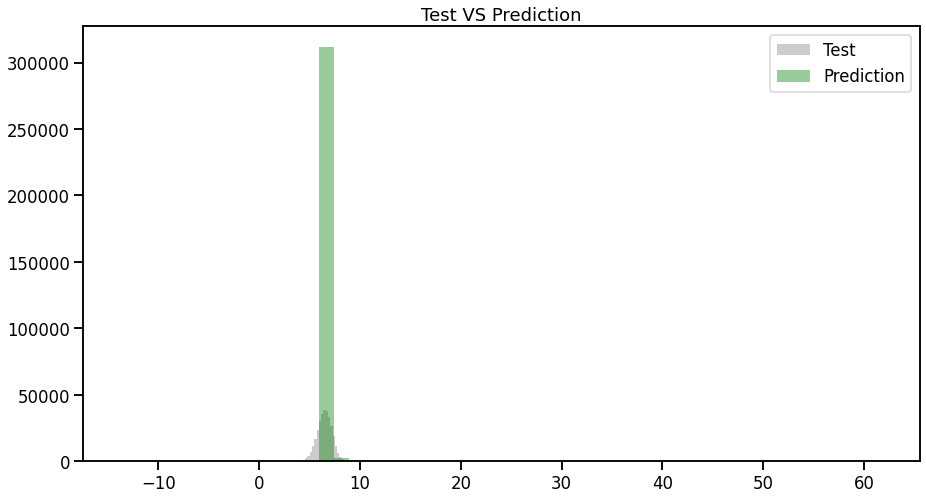

In [ ]:
#prediction vs validation data

plt.figure(figsize=(15,8))
plt.subplot(1,1,1)
sns.distplot(y_test, kde=False, color="grey", label="Test")

plt.subplot(1,1,1)
sns.distplot(lr_pred, kde=False, color="green", label="Prediction")
plt.legend()
plt.title("Test VS Prediction")

- Observations shows us that Linear Regression isn't performing well even.

### Decision Tree

In [ ]:
#Decision tree implementation

from sklearn.tree import DecisionTreeRegressor


est_dt = DecisionTreeRegressor(criterion="mse", max_depth=10)
est_dt.fit(X_train, y_train)
dt_pred = est_dt.predict(X_test)
dt_pred

array([6.14978544, 6.89470535, 5.92463561, ..., 6.15125982, 5.92200571,
       6.14978544])

In [ ]:
#Examining metrics

print ("Training Score : " , est_dt.score(X_train, y_train))

print ("Validation Score : ", est_dt.score(X_test, y_test))

print ("Cross Validation Score : " , cross_val_score(est_dt, X_train, y_train, cv=5).mean())

print ("R2_Score : ", r2_score(y_test,dt_pred, ))

print ("RMSE : ", np.sqrt(mean_squared_log_error(dt_pred, y_test)))

Training Score :  0.4672458719935859
Validation Score :  0.4578961450455241
Cross Validation Score :  0.44709731985282997
R2_Score :  0.4578961450455241
RMSE :  0.08841866660303647


- This time our decision tree model is not trained well as we can identify from scores, training score and cross validation score is close to 0.45 compared to last model where it was around 0.94.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



Text(0.5, 1.0, 'Test VS Prediction')

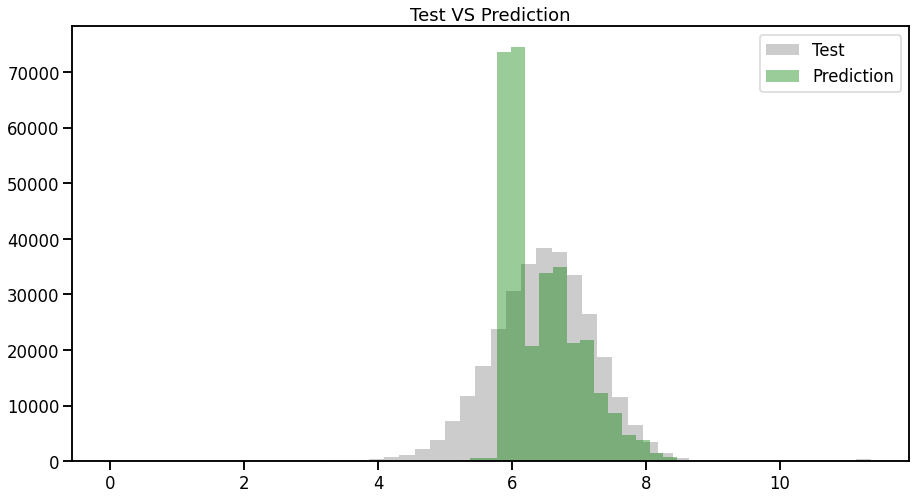

In [ ]:
#prediction vs reality check

plt.figure(figsize=(15,8))
plt.subplot(1,1,1)
sns.distplot(y_test, kde=False, color="grey", label="Test")

plt.subplot(1,1,1)
sns.distplot(dt_pred, kde=False, color="green", label="Prediction")
plt.legend()
plt.title("Test VS Prediction")

- This model gave us loss of 0.0885, we can say it is good but not the acceptable, knowing the fact that we got RMSE of 0.030 in previous approach where we applied PCA.

### Random Forest

In [ ]:
#implementation of forest algorithm

from sklearn.ensemble import RandomForestRegressor

est_rf = RandomForestRegressor(criterion="mse", n_estimators=5, max_depth=10)
est_rf.fit(X_train, y_train)
rf_pred = est_rf.predict(X_test)
rf_pred

array([6.27635155, 6.8808863 , 5.91898471, ..., 6.2702374 , 5.92325503,
       6.1635999 ])

In [ ]:
#examining metrics

print ("Training Score : " , est_rf.score(X_train, y_train))

print ("Validation Score : ", est_rf.score(X_test, y_test))

print ("Cross Validation Score : " , cross_val_score(est_rf, X_train, y_train, cv=5).mean())

print ("R2_Score : ", r2_score( y_test,rf_pred))

print ("RMSE : ", np.sqrt(mean_squared_log_error(rf_pred, y_test)))

Training Score :  0.4769384659871627
Validation Score :  0.4694874271843895
Cross Validation Score :  0.4701827764447882
R2_Score :  0.4694874271843895
RMSE :  0.08781610821171891


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



Text(0.5, 1.0, 'Test VS Prediction')

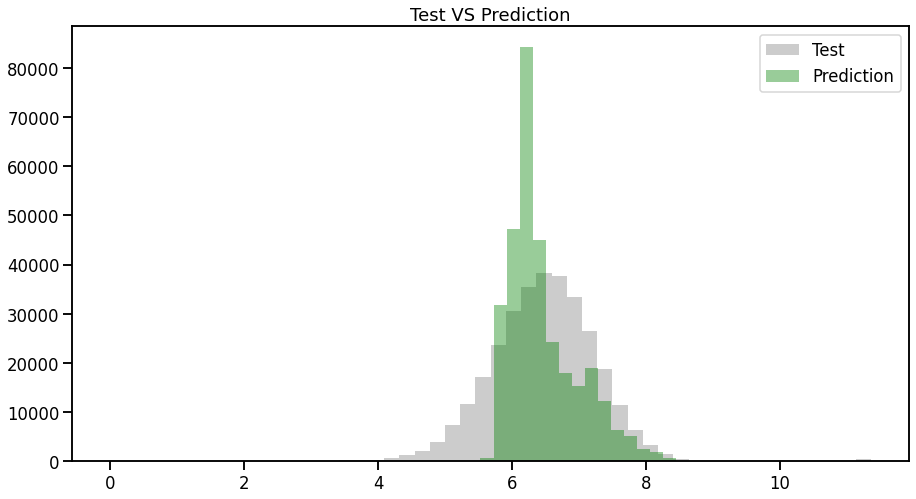

In [ ]:
#prediction vs reality check

plt.figure(figsize=(15,8))
plt.subplot(1,1,1)
sns.distplot(y_test, kde=False, color="grey", label="Test")

plt.subplot(1,1,1)
sns.distplot(rf_pred, kde=False, color="green", label="Prediction")
plt.legend()
plt.title("Test VS Prediction")

- Again the loss value we got here is 0.0870 is good when tried to match with Decision Tree's RMSE ,i.e, 0.0885.

### Decision Tree with Hyperparameter tuning

In [ ]:
params = {'max_depth':[10,11,12,None], "min_samples_split":[5,7,9,11], 'max_features':[2,5,7,10]}

grid = GridSearchCV(est_dt, params, cv=5)
grid.fit(X_train, y_train)
grid_pred = grid.predict(X_test)
print (grid_pred)
grid.best_params_

[5.95176202 7.42526916 5.60284677 ... 5.77778946 5.31210194 6.2857771 ]


{'max_depth': None, 'max_features': 10, 'min_samples_split': 11}

In [ ]:
print ("Training Score : " , grid.score(X_train, y_train))

print ("Validation Score : ", grid.score(X_test, y_test))

print ("R2_Score after parameter tuning : ", r2_score(grid_pred, y_test))

print ("RMSE after parameter tuning : ", np.sqrt(mean_squared_log_error(grid_pred, y_test)))

Training Score :  0.9091109488187002
Validation Score :  0.5520940548913749
R2_Score after parameter tuning :  0.5113037984932809
RMSE after parameter tuning :  0.08314458377228073


- This model gave us loss of 0.08312 as compare to Decision
Tree model without model it gave 0.0885 a slight difference.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



Text(0.5, 1.0, 'Test VS Prediction')

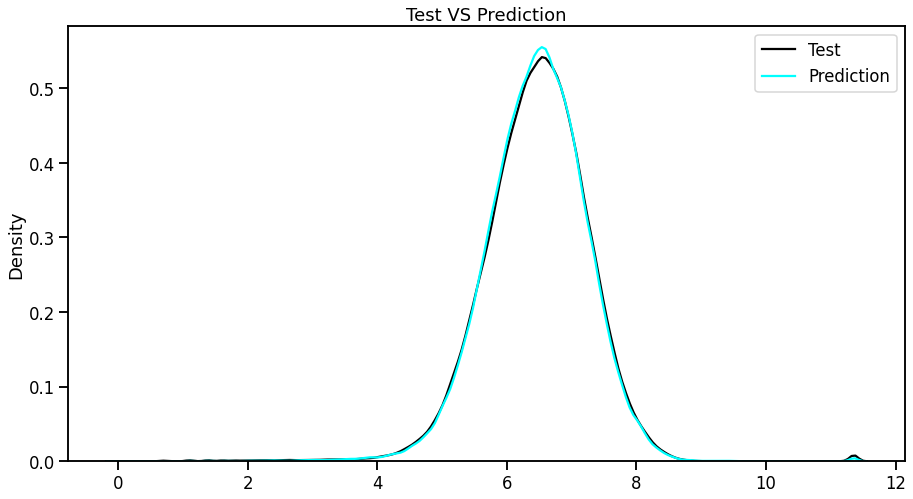

In [ ]:
#prediction vs reality check

plt.figure(figsize=(15,8))
plt.subplot(1,1,1)
sns.distplot(y_test, hist=False, color="black", label="Test", )

plt.subplot(1,1,1)
sns.distplot(grid_pred, hist=False, color="cyan", label="Prediction")
plt.legend()
plt.title("Test VS Prediction")

# overall conclusion:

- Observed which taxi service provider is most Frequently used by New Yorkers.


- Found out few trips which were of duration 528 Hours to 972 Hours, possibly Outliers.


- Passenger count Analysis showed us that there were few trips with Zero Passengers and One trip with 7,8 and 9 passengers.


- Monthly trip analysis gives us a insight of Month – March and April marking the highest number of Trips while January marking lowest, possibly due to Snowfall.

# Recommended Approach:

- Apply Standard Scaling on the Dataset to Normalize the values.


- Further, Apply PCA to reduce dimensions, as you’ll extract features from our primary DateTime Feature. Those additional features might lead our model to suffer from **“Curse of dimensionality”** and could drastically affect performance.


- Pass the PCA Transformed data in our ML Regression Algorithms and Evaluate results.

# Also we can try this Approach

- Also when we can use IQR finding and removing outlier technique and then apply hyperparameter technique it will give us best result.


- We can perform hyper tuning on our Algorithm to get the most out of it but Hyper Tuning consume lot of time and resources of the system depending upon the how big the Data we have and what algorithm we're using. It will go through number of Iterations and try to come up with the best possible value for us. 